## 1. [Data Preprocessing and Exploration (4 marks)](#part1)
*	Load the chosen dataset and perform initial data exploration to understand its structure and characteristics.
*	Preprocess the data, handling missing values, scaling, and encoding categorical features if necessary.
*	Split the dataset into a training set and a test set.

## 2. [Unsupervised Learning Model Development (6 marks)](#part2)
*	Implement an autoencoder architecture using Keras to learn the normal patterns within the data.
*	Train the autoencoder on the training data with the objective of minimizing reconstruction error.
*	Use the trained autoencoder to reconstruct the data and calculate the reconstruction error for each instance.

## 3. [Anomaly Detection (6 marks)](#part3)
*	Define a threshold for the reconstruction error above which instances are considered anomalous.
*	Identify instances in the test set that have a reconstruction error exceeding the threshold.
*	Flag these instances as anomalies.

## 4. [Actionable Recommendations (4 marks)](#part4)
*	For each detected anomaly, analyze the features that contributed the most to the anomaly.
*	Based on the specific features and context, provide actionable recommendations or suggestions for further investigation.
*	These recommendations could involve suggesting immediate actions or flagging the anomalies for further analysis by domain experts.

## 5. [Evaluation and Visualization (6 marks)](#part5)
*	Evaluate the performance of the anomaly detection model using metrics such as precision, recall, F1-score, and ROC curve.
*	Visualize the detected anomalies along with the actionable recommendations in a meaningful way.
*	Use visualizations and summary statistics to convey insights gained from the analysis.

## 6. [Model Refinement and Optimization (4 marks)](#part6)
*	Experiment with different autoencoder architectures, hyperparameters, and reconstruction error thresholds to fine-tune the model's performance.
*	Apply techniques such as learning rate scheduling, regularization, and dropout to improve the model's generalization and robustness.


In [1]:
# Import libraries
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix
from sklearn.model_selection import ParameterGrid
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE



## 1. Data Preprocessing and Exploration <a id='part1'></a>

### The Caltech101 dataset had approximately 101 object categories. 
### However, the actual number of distinct labels in the dataset is 102: 101 object categories and one `background_google` class (id=4), which is often excluded from classification tasks.
### But we load full datasets and exclude `background_google` from training data to test the ability to detect `background_google` as outliers

In [10]:
# Function to preprocess the data
def preprocess_data(dataset, img_size=(256, 256), exclude_class= None):
    images = []
    labels = []
    loaded=0
    for image, label in dataset:
        if exclude_class:
            if label in exclude_class: 
                continue
        image = tf.image.resize(image, img_size)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize the image
        images.append(image)
        labels.append(label)
        loaded=loaded+1
    print (f"Loaded {loaded}/{len(dataset)} images")
    return np.array(images), np.array(labels)

# Load and preprocess the Caltech-101 dataset
def load_caltech101(img_size=(256, 256)):
    # Download and split the dataset
    (train_data, val_data, test_data), info = tfds.load('caltech101', split=['train[:70%]', 'train[70%:85%]', 'train[85%:]'],
                                              as_supervised=True, with_info=True)
    
    # Retrieve label names
    label_names = info.features['label'].names

    # Create a dictionary mapping label IDs to names
    class_name = {i: name for i, name in enumerate(label_names)}
    
    
    return (train_data, val_data, test_data), class_name

IMG_SIZE=256
(train_data, val_data, test_data), class_name = load_caltech101(img_size=(IMG_SIZE, IMG_SIZE))

exclude_labels = ['background_google']
exclude_class = [key for key, value in class_name.items() if value in ['background_google']]

# Exclude in train and val, not test
train_images, train_labels = preprocess_data(train_data, img_size=(IMG_SIZE, IMG_SIZE), exclude_class=exclude_class)
val_images, val_labels = preprocess_data(val_data, img_size=(IMG_SIZE, IMG_SIZE), exclude_class=exclude_class)
test_images, test_labels = preprocess_data(test_data, img_size=(IMG_SIZE, IMG_SIZE))    

print(f"Training data size: {train_images.shape}, \nValidation data size: {val_images.shape}, \nTesting data size: {test_images.shape}")


Loaded 2121/2141 images
Loaded 454/459 images
Loaded 459/459 images
Training data size: (2121, 256, 256, 3), 
Validation data size: (454, 256, 256, 3), 
Testing data size: (459, 256, 256, 3)


In [11]:
def get_class_data(dataset, class_to_get, img_size=(256, 256)):
    images = []
    labels = []
    loaded=0
    for image, label in dataset:
        if label != class_to_get:
            continue
        image = tf.image.resize(image, img_size)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize the image
        images.append(image)
        labels.append(label)
        loaded=loaded+1
    print (f"Loaded {loaded}/{len(dataset)} images")
    return np.array(images), np.array(labels)

anormal_images, anormal_labels = get_class_data(train_data, class_to_get=4, img_size=(IMG_SIZE, IMG_SIZE))
test_images = np.concatenate((test_images, anormal_images))
test_labels = np.concatenate((test_labels, anormal_labels))
anormal_images, anormal_labels = get_class_data(val_data, class_to_get=4, img_size=(IMG_SIZE, IMG_SIZE))
val_images = np.concatenate((val_images, anormal_images))
val_labels = np.concatenate((val_labels, anormal_labels))

Loaded 20/2141 images
Loaded 5/459 images


In [12]:
len(test_images), len(test_labels)

(479, 479)

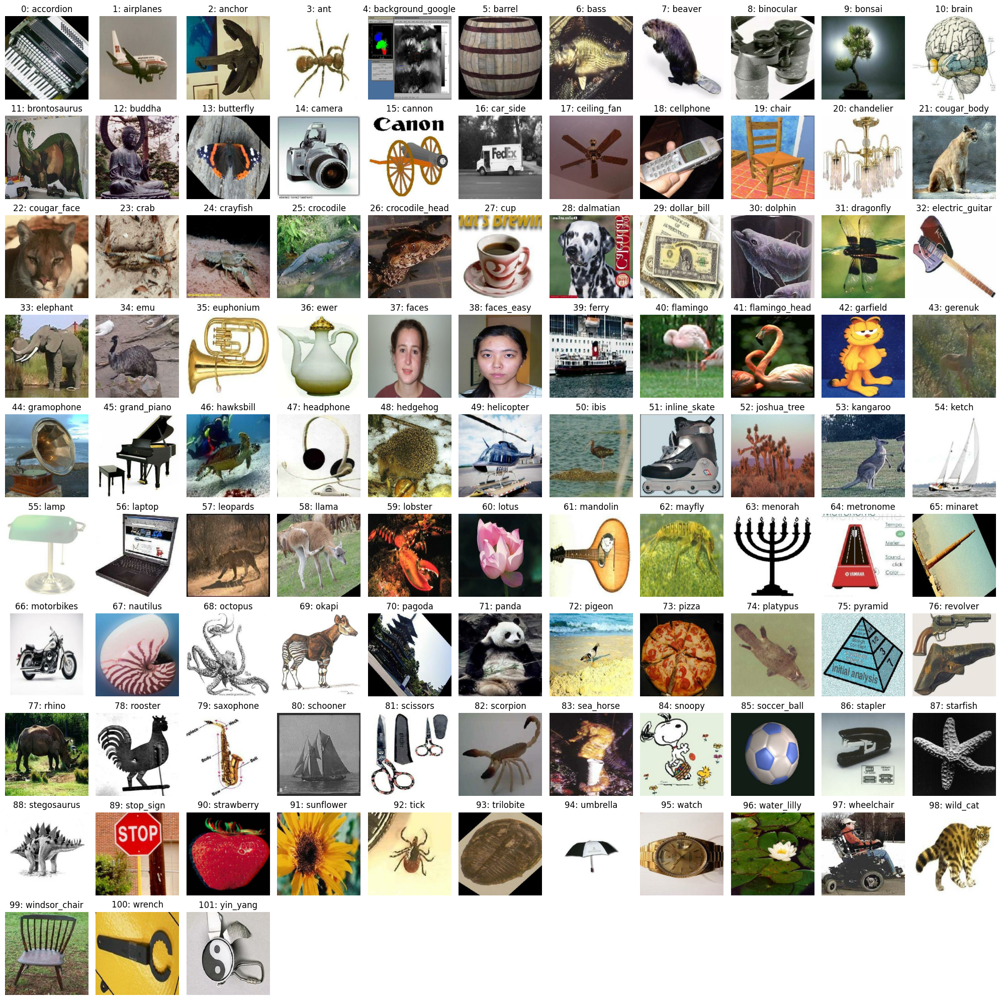

In [13]:
import numpy as np
import matplotlib.pyplot as plt

def show_one_image_per_class(images, labels, label_map, num_classes=101):
    """
    Display one image per class.

    Parameters:
    - images: Array of images.
    - labels: Array of labels.
    - label_map: Dictionary mapping label indices to class names.
    - num_classes: Total number of classes (default is 101 for Caltech-101).

    """
    plt.figure(figsize=(20, 20))

    shown_classes = set()
    # Loop through sorted label indices
    for idx in np.argsort(labels):
        label = labels[idx]
        #print (label, shown_classes)
        if label not in shown_classes:
            plt.subplot(10, 11, len(shown_classes) + 1)
            plt.imshow(images[idx])
            plt.title(f'{label}: {label_map[label]}')
            plt.axis('off')
            shown_classes.add(label)
            if len(shown_classes) == num_classes:
                break

    plt.tight_layout()
    plt.show()

show_one_image_per_class(test_images, test_labels, class_name, num_classes=102)

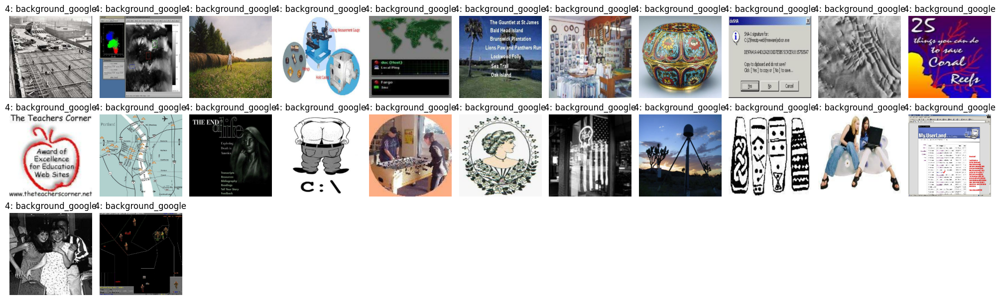

In [14]:
def show_image_of_class(images, labels, label_map, class_to_show):
    """
    Display one class images

    Parameters:
    - images: Array of images.
    - labels: Array of labels.
    - label_map: Dictionary mapping label indices to class names.
    - class_to_show: Class to show.
    """
    plt.figure(figsize=(20, 20))
    i = 0
    # Loop through sorted label indices
    for idx in range(len(labels)):
        if labels[idx] == class_to_show:
            #print(f"Print image {idx}")
            i = i+1
            plt.subplot(10, 11, i)
            plt.imshow(images[idx])
            plt.title(f'{class_to_show}: {label_map[class_to_show]}')
            plt.axis('off')

    plt.tight_layout()
    plt.show()

show_image_of_class(test_images, test_labels, class_name, class_to_show=4)

No missing values in training images!

Visualizing Train Data:


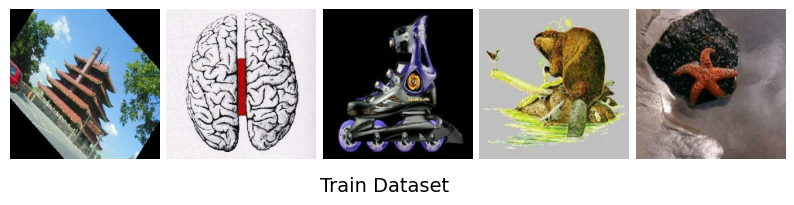

Visualizing Validation Data:


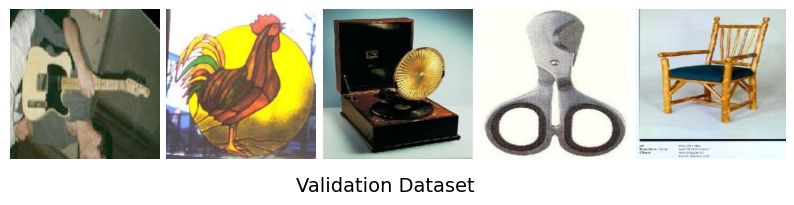

Visualizing Test Data:


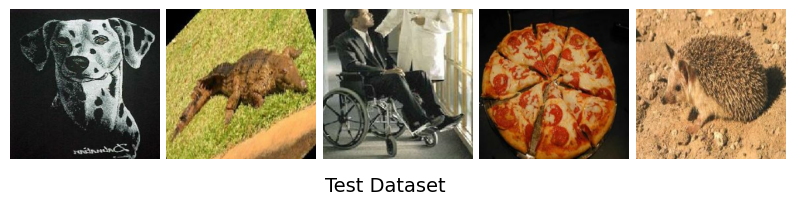

In [15]:
# Check for missing values
if np.isnan(train_images).any():
    print("Missing values detected in training images!\n")
else:
    print("No missing values in training images!\n")

# Visualize a few images from the dataset
def visualize_images(images, num_images=5, title="Dataset Visualization"):
    plt.figure(figsize=(10, 4))
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(images[i])
        plt.axis('off')
    plt.subplots_adjust(top=0.75, wspace=0.05, hspace=0.1)
    plt.suptitle(title, fontsize=14, y=0.2)
    plt.show()

# Visualize a few images from the train dataset
print("Visualizing Train Data:")
visualize_images(train_images, title="Train Dataset")

# Visualize a few images from the validation dataset (if needed)
print("Visualizing Validation Data:")
visualize_images(val_images, title="Validation Dataset")

# Visualize a few images from the test dataset
print("Visualizing Test Data:")
visualize_images(test_images, title="Test Dataset")

## 2. Unsupervised Learning Model Development <a id='part2'></a>

In [16]:
# Define the  autoencoder model
def create_autoencoder(input_shape, encoding_dim=256):
    input_img = layers.Input(shape=input_shape)

    # Encoder
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)  # 128x128x32
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)  # 64x64x64

    # Bottleneck
    encoded = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)

    # Decoder
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2, 2))(x)  # 64x64x64
    x = layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)  # 128x128x32

    decoded = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)  # 256x256x3

    autoencoder = models.Model(input_img, decoded)
    autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='mse')
    return autoencoder

# Set input shape
input_shape = (IMG_SIZE, IMG_SIZE, 3) # RGB 3 channels

# Build the improved autoencoder
autoencoder = create_autoencoder(input_shape, encoding_dim=512)
autoencoder.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 64, 64, 64)     │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 128, 128, 32)   │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 256, 256, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 186,371 (728.01 KB)

 Trainable params: 186,371 (728.01 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 0.0707
Epoch 1: val_loss improved from inf to 0.01383, saving model to best_autoencoder_improved3.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 118s 3s/step - loss: 0.0700 - val_loss: 0.0138 - learning_rate: 0.0010
Epoch 2/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 0.0128
Epoch 2: val_loss improved from 0.01383 to 0.00959, saving model to best_autoencoder_improved3.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 99s 3s/step - loss: 0.0128 - val_loss: 0.0096 - learning_rate: 0.0010
Epoch 3/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 0.0080
Epoch 3: val_loss improved from 0.00959 to 0.00653, saving model to best_autoencoder_improved3.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 98s 3s/step - loss: 0.0080 - val_loss: 0.0065 - learning_rate: 0.0010
Epoch 4/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 0.0068
Epoch 4: val_loss improved from 0.00653 to 0.00600, saving model to best_autoencoder_improved3.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 114s 3s/step - loss: 0.00

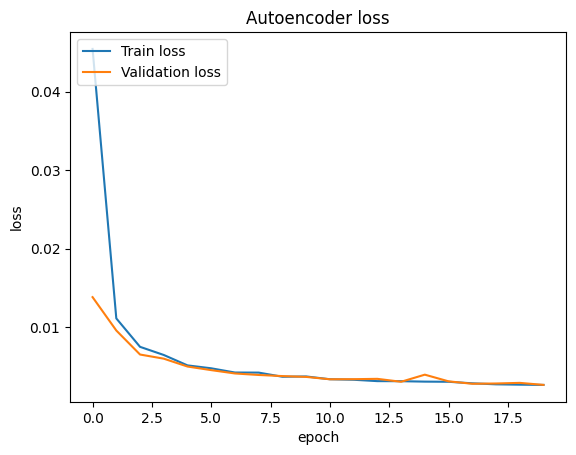

15/15 ━━━━━━━━━━━━━━━━━━━━ 9s 539ms/step - loss: 0.0026
Test Loss: 0.0027047607582062483
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 509ms/step


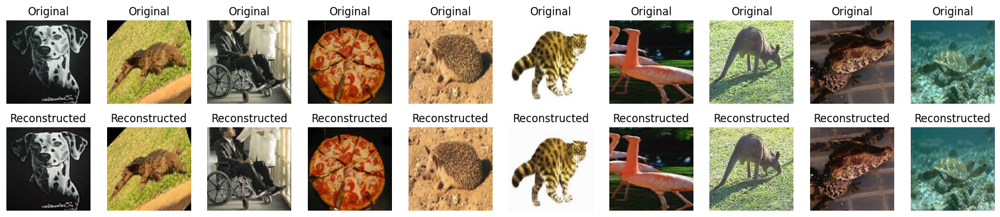

In [17]:
def plot_history(history, val=False, metrics=['accuracy', 'loss'], model_name = None):
    """
    plot_history : Plot training history
    Parameters
    ----------
    history : keras history object
    val : Default False, for plot validation metric
    metrics: Default ['accuracy', 'loss'], list of metric to plot
    """
    for metric in metrics:
        # summarize history for metric
        plt.plot(history.history[metric])
        if (val): plt.plot(history.history['val_' + metric])
        if model_name:
            plt.title(model_name + " " + metric)
        else:
            plt.title('Model ' + metric)
        plt.ylabel(metric)
        plt.xlabel('epoch')
        if (val): 
            plt.legend(['Train '+metric, 'Validation ' + metric], loc='upper left')
        else:
            plt.legend(['Train ' + metric], loc='upper left')
        plt.show()
        
# Main function
def train_autoencoder():
    # Define callbacks
    checkpoint_callback = ModelCheckpoint(
        'best_autoencoder_improved3.keras',
        monitor='val_loss',
        mode='min',
        save_best_only=True,
        verbose=1
    )
    lr_scheduler = ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.5, 
        patience=5, 
        min_lr=1e-6, 
        verbose=1
    )
    early_stopping = EarlyStopping(
        monitor='val_loss', 
        patience=3, 
        restore_best_weights=True, 
        min_delta=0.0001,
        verbose=1
    )

    # Train the autoencoder
    history = autoencoder.fit(
        train_images, train_images,
        epochs=20,
        batch_size=64,
        validation_data=(val_images, val_images),
        callbacks=[checkpoint_callback, lr_scheduler, early_stopping],
        verbose=1
    )
    
    plot_history(history, 
                val=True, 
                metrics=['loss'], 
                model_name = 'Autoencoder')

    # Load the best saved model
    best_autoencoder = tf.keras.models.load_model('best_autoencoder_improved3.keras')

    # Evaluate on test data
    test_loss = best_autoencoder.evaluate(test_images, test_images, verbose=1)
    print(f"Test Loss: {test_loss}")

    # Reconstruct test images
    reconstructed_images = best_autoencoder.predict(test_images)

    return reconstructed_images
    
# Visualize original and reconstructed images
def visualize_reconstruction(original, reconstructed, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original[i])
        plt.title("Original")
        plt.axis("off")

        # Reconstructed images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed[i])
        plt.title("Reconstructed")
        plt.axis("off")
    plt.show()

#Train autoencoder
reconstructed_images=train_autoencoder()

# Visualize the original and reconstructed images
visualize_reconstruction(test_images, reconstructed_images)


In [18]:
# Function to compute reconstruction errors
def compute_reconstruction_error(original, reconstructed):
    return np.mean(np.square(original - reconstructed), axis=(1, 2, 3))  # Per image error

reconstruction_errors = compute_reconstruction_error(test_images, reconstructed_images)

In [19]:
# Sort indices by error in descending order
sorted_indices = np.argsort(reconstruction_errors)  # Negative for descending order

# Sort errors, images, and reconstructions
sorted_errors = reconstruction_errors[sorted_indices]
sorted_X_test = test_images[sorted_indices]
sorted_reconstructed_images = reconstructed_images[sorted_indices]

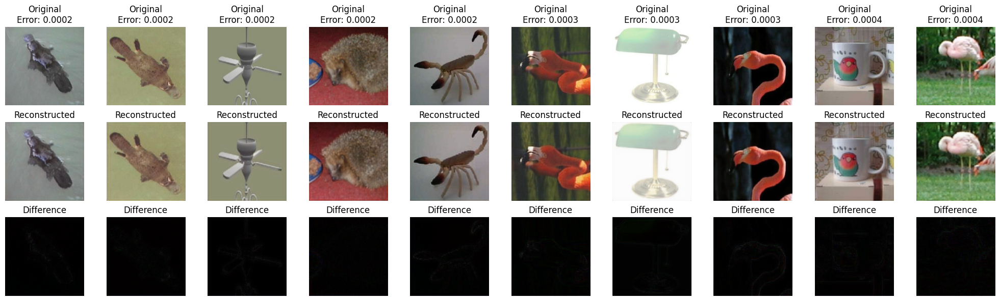

In [20]:
# Number of images to visualize
num_images = 10

# Create a figure
plt.figure(figsize=(20, 6))

for i in range(num_images):
    # Original image
    ax = plt.subplot(3, num_images, i + 1)
    plt.imshow(sorted_X_test[i])
    plt.title(f"Original\nError: {sorted_errors[i]:.4f}")
    plt.axis("off")
    
    # Reconstructed image
    ax = plt.subplot(3, num_images, i + 1 + num_images)
    plt.imshow(sorted_reconstructed_images[i])
    plt.title("Reconstructed")
    plt.axis("off")
    
    # Difference image (optional for visualization)
    difference = np.abs(sorted_X_test[i] - sorted_reconstructed_images[i])
    ax = plt.subplot(3, num_images, i + 1 + 2 * num_images)
    plt.imshow(difference)
    plt.title("Difference")
    plt.axis("off")

plt.tight_layout()
plt.show()

## 3. Anomaly Detection <a id='part3'></a>

In [21]:
# Calculate the number of images per class ID 
unique_classes, counts_per_class = np.unique(test_labels, return_counts=True) 
# Create a dictionary to map each class ID to its count 
images_per_class = dict(zip(unique_classes, counts_per_class)) 

print(f"Number of images background_google in test set per total test images {images_per_class[4]}/{len(test_labels)}")

Number of images background_google in test set per total test images 24/479


In [22]:
def get_detection_result(reconstruction_errors, anomalous_indices_true, threshold):
    #Threshold for Reconstruction Error
    threshold_error = np.percentile(reconstruction_errors, threshold)

    #Identify and flag anomalies
    anomalies = reconstruction_errors > threshold_error
    anomalous_indices = np.where(anomalies)[0]
    
    # Calculate the intersection of true indices and predicted indices 
    true_positives = np.intersect1d(anomalous_indices_true, anomalous_indices) 
    # Count the number of true positives 
    num_true_positives = len(true_positives)
    
    print (f"Outliers list with autoencoder threshold {threshold}: Total {len(anomalous_indices)}, {len(anomalous_indices)-num_true_positives} images from clean set, {num_true_positives} background_google images")
    
    return anomalies, anomalous_indices

anomalous_indices_true = np.where(test_labels == 4)[0]

for threshold in range (75, 95):
    anomalies, anomalous_indices = get_detection_result(reconstruction_errors, anomalous_indices_true,  threshold)

    # Print anomaly detection results
    #print(f"Number of anomalies detected: {np.sum(anomalies)}")
    #print(f"Indices of anomalous test samples: {anomalous_indices}")

Outliers list with autoencoder threshold 75: Total 120, 107 images from clean set, 13 background_google images
Outliers list with autoencoder threshold 76: Total 115, 103 images from clean set, 12 background_google images
Outliers list with autoencoder threshold 77: Total 110, 99 images from clean set, 11 background_google images
Outliers list with autoencoder threshold 78: Total 106, 95 images from clean set, 11 background_google images
Outliers list with autoencoder threshold 79: Total 101, 91 images from clean set, 10 background_google images
Outliers list with autoencoder threshold 80: Total 96, 86 images from clean set, 10 background_google images
Outliers list with autoencoder threshold 81: Total 91, 81 images from clean set, 10 background_google images
Outliers list with autoencoder threshold 82: Total 87, 77 images from clean set, 10 background_google images
Outliers list with autoencoder threshold 83: Total 82, 72 images from clean set, 10 background_google images
Outliers lis

Outliers list with autoencoder threshold 90: Total 48, 40 images from clean set, 8 background_google images


<Figure size 640x480 with 0 Axes>

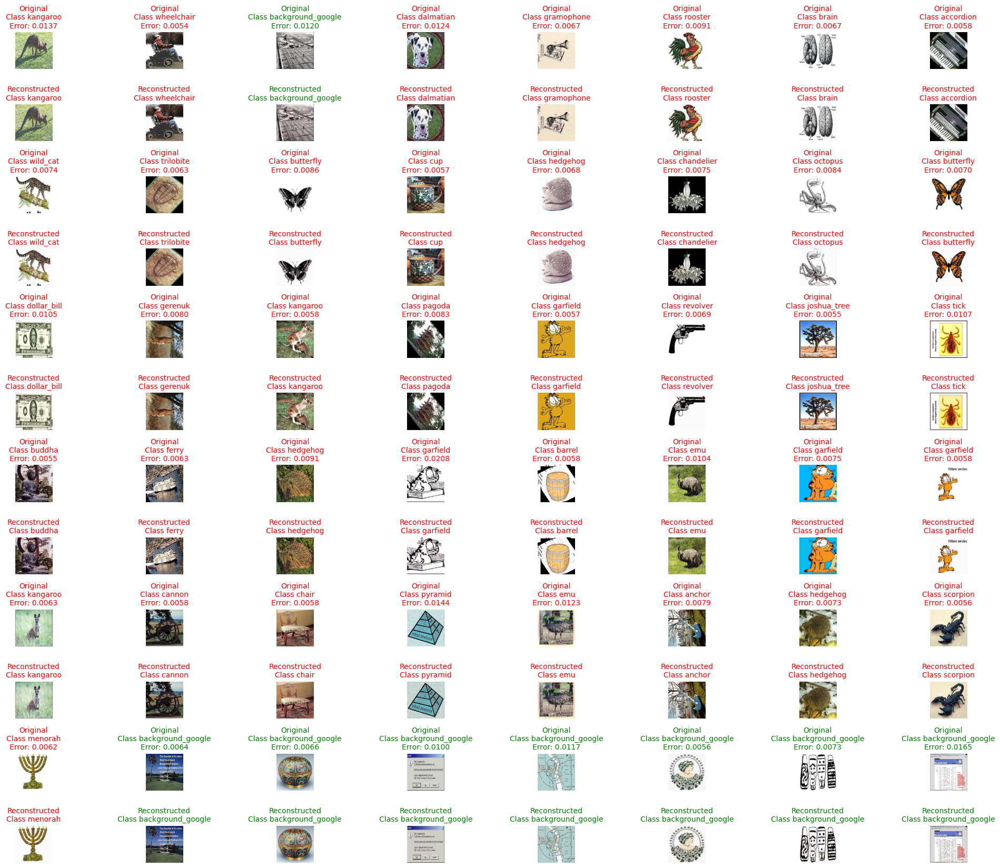

In [23]:
# Set figure size and define rows for original and reconstructed images


def plot_reconstruted_images(test_images, test_labels, threshold):
    anomalies, anomalous_indices = get_detection_result(reconstruction_errors, anomalous_indices_true,  threshold)
    threshold_error = np.percentile(reconstruction_errors, threshold)
    # Add title for the entire plot
    plt.suptitle("Anomaly Detection: Original vs. Reconstructed Images\n"
                f"Threshold for Reconstruction Error: {threshold_error:.4f} ({threshold}th Percentile)", fontsize=14, y=0.95)

    # Iterate over the first 4x5 anomalous instances
    n_cols=8
    n_rows=8
    plt.figure(figsize=(n_cols*2.5, n_rows*3))  # Adjust width and height as needed
    for r in range (n_rows):
        for i, idx in enumerate(anomalous_indices[r*n_cols:(r+1)*n_cols]):
            # Original image
            plt.subplot(n_rows*2, n_cols, i + 1 + 2*r*n_cols)  # Top row: original images
            plt.title(f"Original\nClass {class_name[test_labels[idx]]}\nError: {reconstruction_errors[idx]:.4f}", 
                      fontsize=10,
                      color='green' if test_labels[idx] == 4 else 'red')
            plt.imshow(test_images[idx])
            plt.axis('off')

            # Reconstructed image
            plt.subplot(n_rows*2, n_cols, i + 1 + n_cols + 2*r*n_cols)  # Bottom row: reconstructed images
            plt.title(f"Reconstructed\nClass {class_name[test_labels[idx]]}", 
                      fontsize=10,
                      color='green' if test_labels[idx] == 4 else 'red')
            plt.imshow(reconstructed_images[idx])
            plt.axis('off')

    # Adjust layout for better spacing
    plt.tight_layout(rect=[0, 0, 1, 0.92])  # Leave space for the main title
    plt.show()

plot_reconstruted_images(test_images, test_labels, 90)

Class 4: Original vs. Reconstructed Images


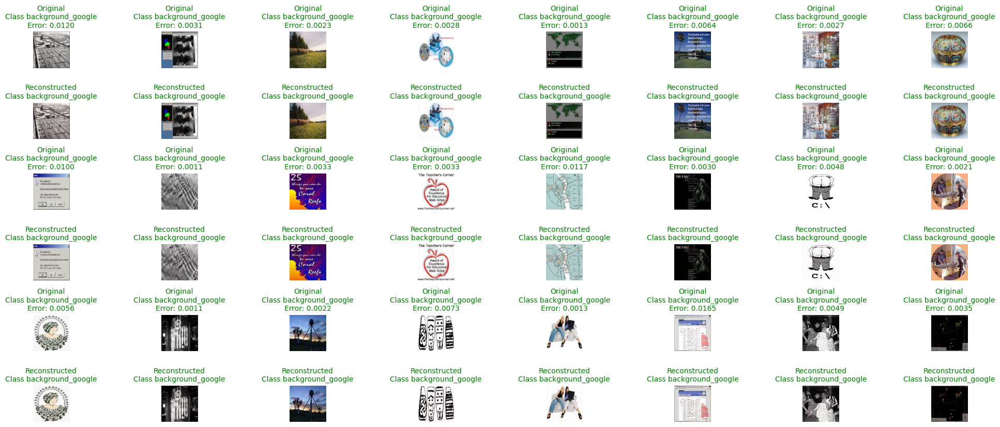

(array([0.00106212, 0.00109932, 0.00133175, 0.00134204, 0.0020918 ,
        0.00216186, 0.00226403, 0.00271612, 0.00279923, 0.00302415,
        0.00309245, 0.00329828, 0.00331005, 0.00353759, 0.00476521,
        0.0048739 , 0.00557637, 0.00644401, 0.00656702, 0.00728546,
        0.00999291, 0.01172185, 0.01196913, 0.01651202], dtype=float32),
 np.float32(0.004951612))

In [24]:
# Set figure size and define rows for original and reconstructed images
def plot_reconstruted_images_of_class(test_images, test_labels, label_to_show):
    # Add title for the entire plot
    print(f"Class {label_to_show}: Original vs. Reconstructed Images")
    indices = np.where(test_labels == label_to_show)[0]
    # Iterate over the first 4x5 anomalous instances
    n_cols=8
    n_rows=8
    plt.figure(figsize=(n_cols*2.5, n_rows*3))  # Adjust width and height as needed
    for r in range (n_rows):
        for i, idx in enumerate(indices[r*n_cols:(r+1)*n_cols]):
            # Original image
            plt.subplot(n_rows*2, n_cols, i + 1 + 2*r*n_cols)  # Top row: original images
            plt.title(f"Original\nClass {class_name[test_labels[idx]]}\nError: {reconstruction_errors[idx]:.4f}", 
                      fontsize=10,
                      color='green' if test_labels[idx] == 4 else 'red')
            plt.imshow(test_images[idx])
            plt.axis('off')

            # Reconstructed image
            plt.subplot(n_rows*2, n_cols, i + 1 + n_cols + 2*r*n_cols)  # Bottom row: reconstructed images
            plt.title(f"Reconstructed\nClass {class_name[test_labels[idx]]}", 
                      fontsize=10,
                      color='green' if test_labels[idx] == 4 else 'red')
            plt.imshow(reconstructed_images[idx])
            plt.axis('off')

    # Adjust layout for better spacing
    plt.tight_layout(rect=[0, 0, 1, 0.92])  # Leave space for the main title
    plt.show()
    
    list_error = [reconstruction_errors[i] for i in indices]
    list_normal = [reconstruction_errors[i] for i in range(len(reconstruction_errors)) if i not in indices]
    return list_error, list_normal

list_error_background, list_error_normal = plot_reconstruted_images_of_class(test_images, test_labels, 4)
np.sort(list_error_background), np.mean(list_error_background)

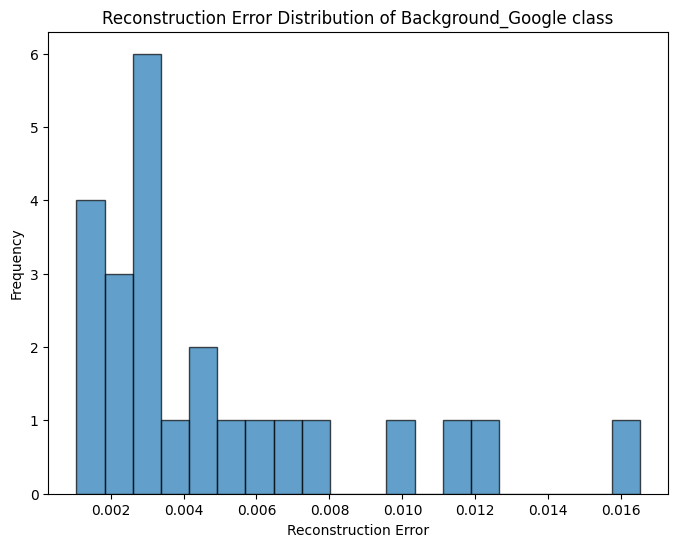

In [25]:
# Create a histogram
plt.figure(figsize=(8, 6))
plt.hist(list_error_background, bins=20, edgecolor='black', alpha=0.7)

# Add labels and title
plt.title("Reconstruction Error Distribution of Background_Google class")
plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency")

# Show the plot
plt.show()

C:\Users\ahkar\AppData\Local\Temp\ipykernel_32724\1923331673.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(list_error_normal, shade=True, label='All test set', color='blue', alpha=0.6)
C:\Users\ahkar\AppData\Local\Temp\ipykernel_32724\1923331673.py:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(list_error_background, shade=True, label='Background_Google class', color='green', alpha=0.6)


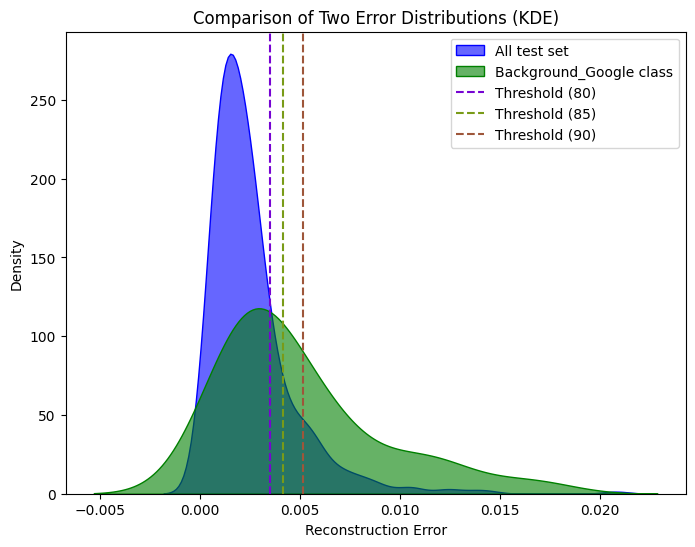

In [26]:
import random
def plot_kde_error(list_error_normal, list_error_background, thresholds):
    # Create a seaborn KDE plot for both distributions
    plt.figure(figsize=(8, 6))

    # KDE plot for the first distribution (errors_1) in blue
    sns.kdeplot(list_error_normal, shade=True, label='All test set', color='blue', alpha=0.6)

    # KDE plot for the second distribution (errors_2) in green
    sns.kdeplot(list_error_background, shade=True, label='Background_Google class', color='green', alpha=0.6)

    ax = plt.gca()
    for threshold in thresholds:
        threshold_error = np.percentile(list_error_normal, threshold)
        random_color = [random.random() for _ in range(3)]
        # Add the vertical threshold line
        plt.axvline(x=threshold_error, color=random_color, linestyle='--', label=f'Threshold ({threshold})')

    # Add labels and title
    plt.title("Comparison of Two Error Distributions (KDE)")
    plt.xlabel("Reconstruction Error")
    plt.ylabel("Density")

    # Show legend
    plt.legend()

    # Show the plot
    plt.show()


plot_kde_error(list_error_normal, list_error_background,
               thresholds=[80, 85 ,90])

Autoencoder metrics: threashold 80: Accuracy 79.12%,	Precision 92.04%,	Recall 79.12%,	F1-score 84.49%
Detail report: 
              precision    recall  f1-score   support

           0       0.96      0.81      0.88       455
           1       0.10      0.42      0.17        24

    accuracy                           0.79       479
   macro avg       0.53      0.61      0.52       479
weighted avg       0.92      0.79      0.84       479



<Figure size 1000x1000 with 0 Axes>

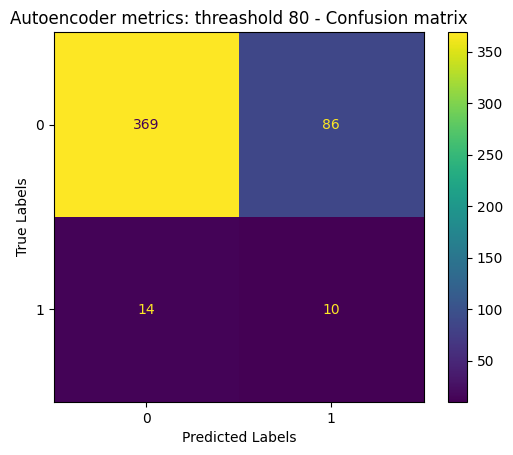

In [29]:
from sklearn.metrics import classification_report, confusion_matrix, multilabel_confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, ConfusionMatrixDisplay
#device = 'GPU' if len(GPUs) > 0 else 'CPU'
def model_report(model_name, 
                 model, 
                 y_test, 
                 y_pred, 
                 class_names=None,
                 model_type = '', 
                 model_note = '', 
                 plot = True, 
                 print_report = True,
                 n_digits_round=2):
   
    
    accuracy  = round(accuracy_score(y_test, y_pred)*100, ndigits=n_digits_round)
    precision = round(precision_score(y_test, y_pred, average='weighted')*100, ndigits=n_digits_round)
    recall     = round(recall_score(y_test, y_pred, average='weighted')*100, ndigits=n_digits_round)
    f1  = round(f1_score(y_test, y_pred, average='weighted')*100, ndigits=n_digits_round)
    print(f"{model_name}: Accuracy {accuracy}%,\tPrecision {precision}%,\tRecall {recall}%,\tF1-score {f1}%")
    
    # Print detail report
    if print_report:
        print ("Detail report: ")
        print (classification_report(y_test, y_pred, target_names=class_names))
    
    # Display confusion matrix plot
    if (plot):
        plt.figure(figsize=(10, 10))
        #disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test_label, y_pred_label), display_labels=class_names)
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred), display_labels=class_names)
        disp.plot()
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.title(model_name + " - Confusion matrix")
        plt.show()
    
    return accuracy, precision, recall, f1

def print_metric(reconstruction_errors, test_labels, threshold):
    threshold_error = np.percentile(reconstruction_errors, threshold)
    y_pred = [1 if error > threshold_error else 0 for error in reconstruction_errors]
    y_true = [1 if labels == 4 else 0 for labels in test_labels]
    model_report(model=None,
                 model_name=f'Autoencoder metrics: threashold {threshold}',
                 y_test=y_true, 
                 y_pred=y_pred)

# print_metric(reconstruction_errors, test_labels, 90)
# print_metric(reconstruction_errors, test_labels, 85)
print_metric(reconstruction_errors, test_labels, 80)


## 4. Actionable Recommendations <a id='part4'></a>

Outliers list with autoencoder threshold 99: Total 5, 4 images from clean set, 1 background_google images

--- Analysis for Threshold: 99 ---
Anomalous Image Index: 7
Class: 53


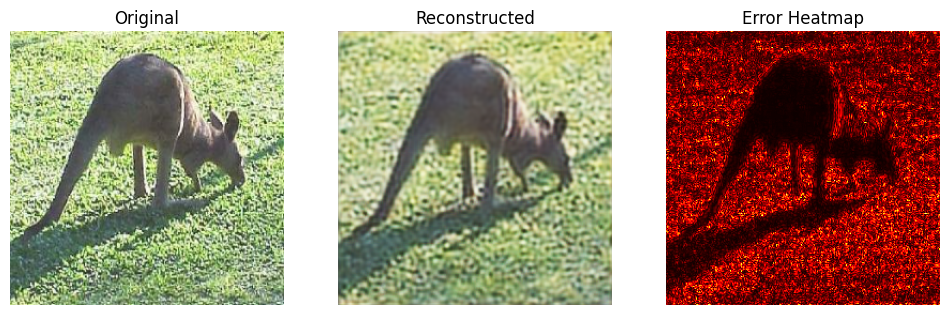

Actionable Recommendations:
- Review this anomaly with domain experts.
- Consider augmenting training data with similar samples.
-------------------------------------------------------
Anomalous Image Index: 58
Class: 28


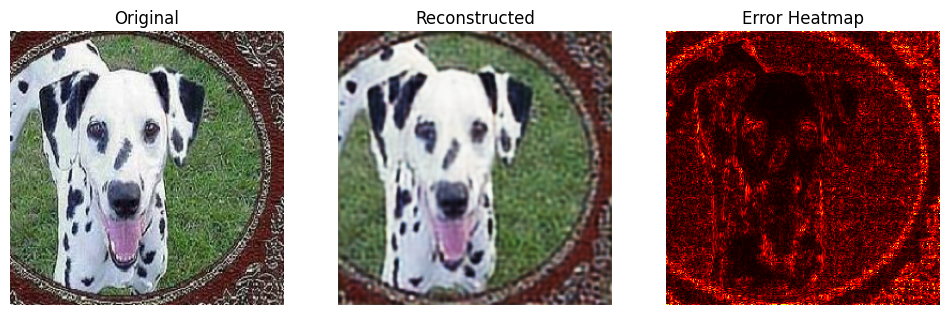

Actionable Recommendations:
- Review this anomaly with domain experts.
- Consider augmenting training data with similar samples.
-------------------------------------------------------
Anomalous Image Index: 317
Class: 42


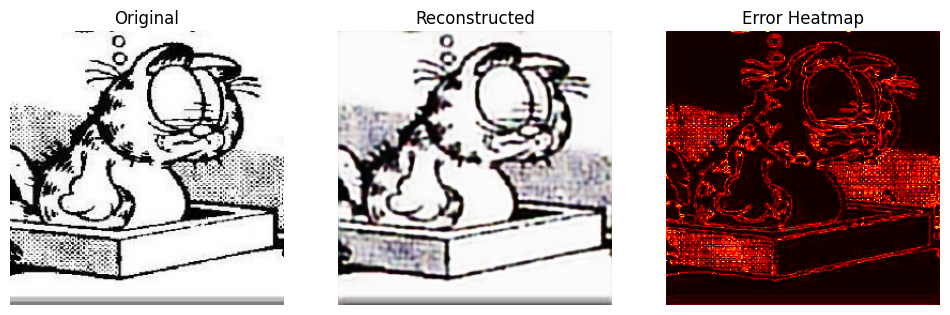

Actionable Recommendations:
- Review this anomaly with domain experts.
- Consider augmenting training data with similar samples.
-------------------------------------------------------
Anomalous Image Index: 409
Class: 75


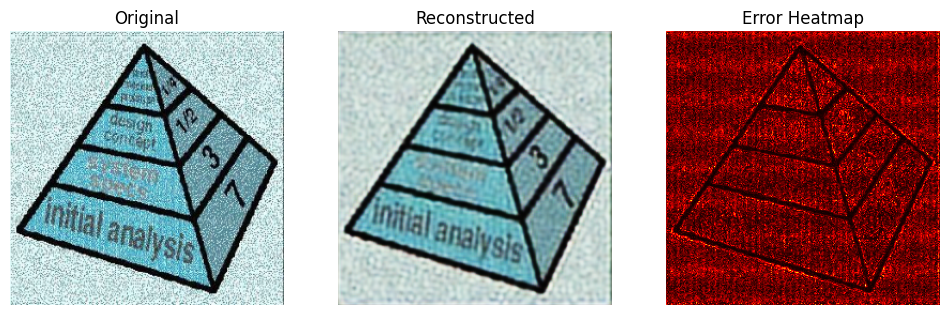

Actionable Recommendations:
- Review this anomaly with domain experts.
- Consider augmenting training data with similar samples.
-------------------------------------------------------
Anomalous Image Index: 476
Class: 4


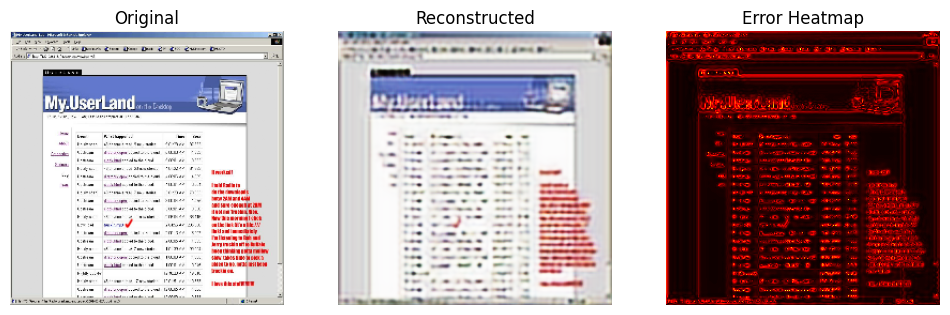

Actionable Recommendations:
- Review this anomaly with domain experts.
- Consider augmenting training data with similar samples.
-------------------------------------------------------


In [37]:
# Function to generate a heatmap of reconstruction errors
def plot_reconstruction_error_heatmap(original_image, reconstructed_image):
    """
    Plot a heatmap of reconstruction errors.
    """
    error_map = np.abs(original_image - reconstructed_image)
    plt.figure(figsize=(12, 4))
    
    # Original image
    ax = plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title("Original")
    plt.axis("off")
    
    # Reconstructed image
    ax = plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_image)
    plt.title("Reconstructed")
    plt.axis("off")
    
    # Error heatmap
    ax = plt.subplot(1, 3, 3)
    plt.imshow(error_map.mean(axis=-1), cmap='hot')
    plt.title("Error Heatmap")
    plt.axis("off")
    
    plt.show()

# Function to analyze anomalies and provide recommendations
def analyze_anomalies(reconstruction_errors, anomalous_indices, original_images, reconstructed_images, threshold, class_labels):
    """
    Analyze anomalies, generate heatmaps, and log actionable recommendations.
    """
    threshold_error = np.percentile(reconstruction_errors, threshold)
    
    print(f"\n--- Analysis for Threshold: {threshold} ---")
    for idx in anomalous_indices:
        print(f"Anomalous Image Index: {idx}")
        class_label = class_labels[idx]
        print(f"Class: {class_label}")
        
        # Visualize the original, reconstructed, and heatmap
        plot_reconstruction_error_heatmap(original_images[idx], reconstructed_images[idx])
        
        # Provide action recommendations
        print("Actionable Recommendations:")
        if class_label == "background_google":
            print("- Investigate irregularities in the background_google class.")
            print("- Collect additional representative samples to enhance model accuracy.")
        else:
            print("- Review this anomaly with domain experts.")
            print("- Consider augmenting training data with similar samples.")
        print("-------------------------------------------------------")

# Simulated call for the function
# Assuming test_images and reconstructed_images are normalized to [0, 1] scale
anomalous_indices_true = np.where(test_labels == 4)[0]  # Background_google class indices
threshold = 99  # Percentile threshold
anomalies, anomalous_indices = get_detection_result(reconstruction_errors, anomalous_indices_true, threshold)

# Analyze anomalies with the defined function
analyze_anomalies(reconstruction_errors, anomalous_indices, test_images, reconstructed_images, threshold, test_labels)

## 5. Evaluation and Visualization <a id='part5'></a>

Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000


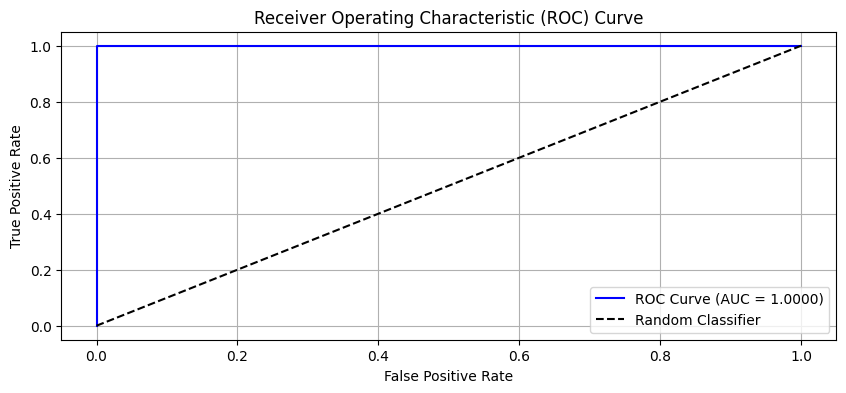

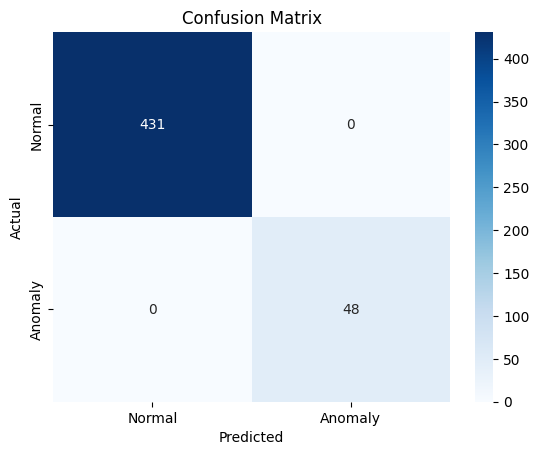

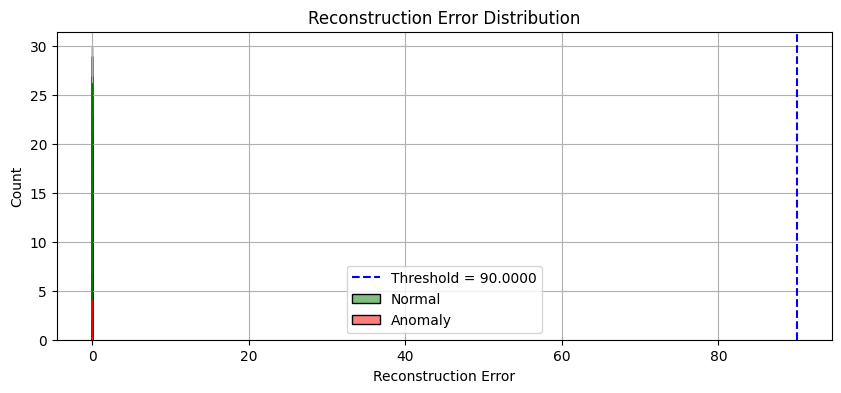

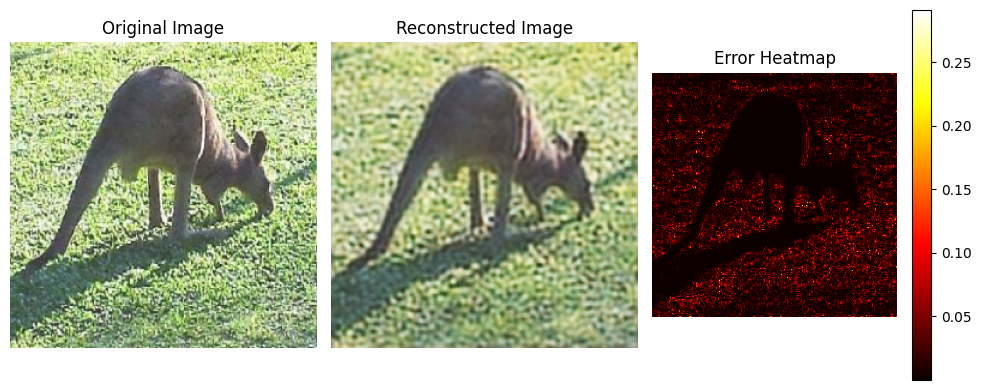

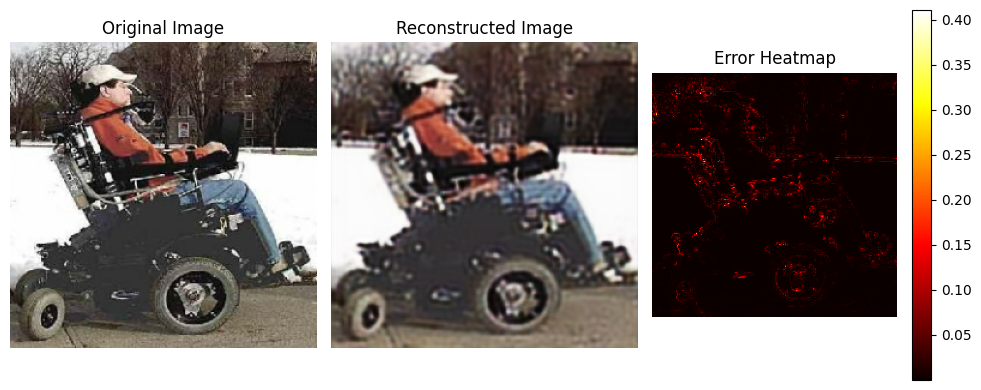

In [31]:

# Binary labels for test samples (0 = normal, 1 = anomaly)
true_labels = np.array([1 if idx in anomalous_indices else 0 for idx in range(len(test_images))])

# Metrics Calculation
predicted_labels = anomalies.astype(int)

precision = precision_score(true_labels, predicted_labels)
recall = recall_score(true_labels, predicted_labels)
f1 = f1_score(true_labels, predicted_labels)

# Print metrics
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

# ROC Curve
fpr, tpr, thresholds = roc_curve(true_labels, reconstruction_errors)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 4))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.4f})", color="blue")
plt.plot([0, 1], [0, 1], "k--", label="Random Classifier")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Confusion Matrix Visualization
cm = confusion_matrix(true_labels, predicted_labels)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Anomaly"], yticklabels=["Normal", "Anomaly"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Histogram of Reconstruction Errors
plt.figure(figsize=(10, 4))
sns.histplot(reconstruction_errors[true_labels == 0], bins=30, label="Normal", color="green", kde=True)
sns.histplot(reconstruction_errors[true_labels == 1], bins=30, label="Anomaly", color="red", kde=True)
plt.axvline(threshold, color="blue", linestyle="--", label=f"Threshold = {threshold:.4f}")
plt.xlabel("Reconstruction Error")
plt.ylabel("Count")
plt.title("Reconstruction Error Distribution")
plt.legend()
plt.grid()
plt.show()

# Visualization of Anomalies with Heatmaps
for idx in anomalous_indices[:2]:  # Visualize top 5 anomalies
    plt.figure(figsize=(10, 4))

    # Original image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(test_images[idx])
    plt.axis("off")

    # Reconstructed image
    plt.subplot(1, 3, 2)
    plt.title("Reconstructed Image")
    plt.imshow(reconstructed_images[idx])
    plt.axis("off")

    # Heatmap of reconstruction error
    pixel_wise_errors = np.square(test_images - reconstructed_images)
    aggregated_errors = np.mean(pixel_wise_errors, axis=-1)  # Aggregate error across channels
    plt.subplot(1, 3, 3)
    plt.title("Error Heatmap")
    plt.imshow(aggregated_errors[idx], cmap="hot")
    plt.colorbar()
    plt.axis("off")

    plt.tight_layout()
    plt.show()


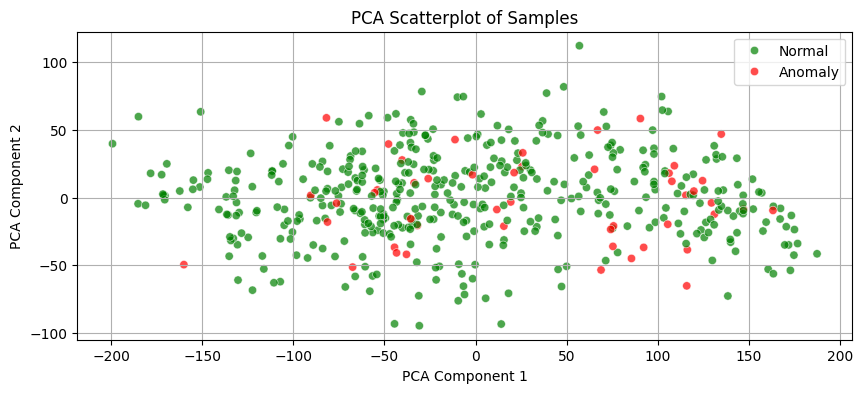

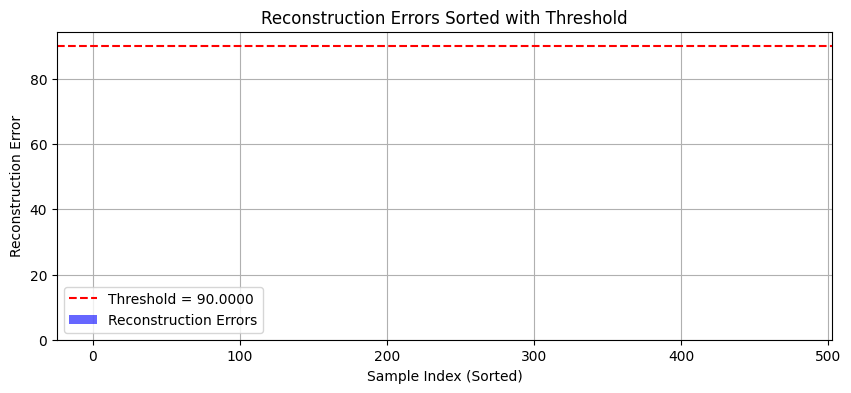

In [32]:
# Dimensionality Reduction (t-SNE/PCA Scatterplot)
# Combine reconstruction errors and labels into a data frame
import pandas as pd

data_embeddings = PCA(n_components=2).fit_transform(reconstructed_images.reshape(len(reconstructed_images), -1))
labels = ['Anomaly' if i in anomalous_indices else 'Normal' for i in range(len(test_images))]
df = pd.DataFrame(data_embeddings, columns=['Dim1', 'Dim2'])
df['Label'] = labels
df['Reconstruction_Error'] = reconstruction_errors

plt.figure(figsize=(10, 4))
sns.scatterplot(data=df, x='Dim1', y='Dim2', hue='Label', palette={"Normal": "green", "Anomaly": "red"}, alpha=0.7)
plt.title("PCA Scatterplot of Samples")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.grid()
plt.show()

# Reconstruction Error Bar Chart
sorted_errors = np.sort(reconstruction_errors)
plt.figure(figsize=(10, 4))
plt.bar(range(len(sorted_errors)), sorted_errors, color='blue', alpha=0.6, label='Reconstruction Errors')
plt.axhline(y=threshold, color='red', linestyle='--', label=f"Threshold = {threshold:.4f}")
plt.xlabel("Sample Index (Sorted)")
plt.ylabel("Reconstruction Error")
plt.title("Reconstruction Errors Sorted with Threshold")
plt.legend()
plt.grid()
plt.show()

## 6. Model Refinement and Optimization <a id='part6'></a>

- In this work, we experimented with various autoencoder architectures and hyperparameters to optimize performance. Multiple models were trained, and their results were compared to identify the most effective configuration. For comparison, we also included the results of the initial autoencoder architecture, which had a complex design and yielded poor results, to highlight the improvements achieved through iterative experimentation.

- Additionally, we tested a Variational Autoencoder (VAE) architecture. However, the VAE did not yield the best results, which might be attributed to dataset-related challenges that impacted its ability to train effectively. This observation underscores the importance of dataset quality and suitability in achieving optimal performance with different architectures.

In [214]:
# Experiment with different autoencoder architectures

def build_autoencoder(input_shape, encoding_dim=128, dropout_rate=0.3, reg_strength=0.01):
    input_img = layers.Input(shape=input_shape)

    # Encoder    
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(reg_strength))(input_img)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)  # 128 x 128 x 64
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(reg_strength))(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)  # 64 x 64 x 128
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(reg_strength))(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)  # 32 x 32 x 256

    # Bottleneck (Latent Representation)
    x = layers.Flatten()(x)
    x = layers.Dense(encoding_dim, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)

    # Decoder
    x = layers.Dense(32 * 32 * 256, activation='relu')(x)
    x = layers.Reshape((32, 32, 256))(x)  # Reshape to match the last pooling layer output
    x = layers.Conv2DTranspose(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)  # 64 x 64 x 256
    x = layers.Conv2DTranspose(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)  # 128 x 128 x 128
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)  # 256 x 256 x 64

    output_img = layers.Conv2DTranspose(3, (3, 3), activation='sigmoid', padding='same')(x)  # 256 x 256 x 3

    autoencoder = models.Model(input_img, output_img)
    autoencoder.compile(optimizer='adam', loss='mse')

    return autoencoder

# Hyperparameter tuning with reduced parameters for faster experimentation
def tune_autoencoder_hyperparameters(train_data, val_data, input_shape):
    param_grid = {
        'encoding_dim': [256],
        'dropout_rate': [0.3],
        'reg_strength': [0.01],
        'learning_rate': [1e-3],
        'batch_size': [32],
        'epochs': [10]
    }

    best_model = None
    best_loss = np.inf
    history_dict = {}

    for params in ParameterGrid(param_grid):
        print(f"Training with parameters: {params}")

        autoencoder = build_autoencoder(input_shape,
                                         encoding_dim=params['encoding_dim'],
                                         dropout_rate=params['dropout_rate'],
                                         reg_strength=params['reg_strength'])

        # Learning rate scheduling
        lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
            initial_learning_rate=params['learning_rate'],
            decay_steps=100000,
            decay_rate=0.96,
            staircase=True)

        autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), loss='mse')


        history = autoencoder.fit(train_images, train_images, epochs=params['epochs'], batch_size=params['batch_size'],
                                  validation_data=(val_images, val_images), verbose=1)

        val_loss = history.history['val_loss'][-1]
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = autoencoder
            history_dict = history.history

    return best_model, history_dict

input_shape = (IMG_SIZE, IMG_SIZE, 3)

# Tune hyperparameters and find the best model
best_model, history_dict = tune_autoencoder_hyperparameters(train_images, val_images, input_shape)

# Evaluate the model on test data
test_loss = best_model.evaluate(test_images, test_images, verbose=1)
print(f"Test Loss: {test_loss}")

# Save the best model
best_model.save('best_autoencoder_model1.keras')

Training with parameters: {'batch_size': 32, 'dropout_rate': 0.3, 'encoding_dim': 256, 'epochs': 10, 'learning_rate': 0.001, 'reg_strength': 0.01}
Epoch 1/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 159s 2s/step - loss: 2.0881 - val_loss: 0.1186
Epoch 2/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 157s 2s/step - loss: 0.1093 - val_loss: 0.1062
Epoch 3/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 156s 2s/step - loss: 0.1031 - val_loss: 0.1058
Epoch 4/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - loss: 0.1013 - val_loss: 0.1057
Epoch 5/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - loss: 0.1043 - val_loss: 0.1056
Epoch 6/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - loss: 0.1012 - val_loss: 0.1057
Epoch 7/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - loss: 0.1023 - val_loss: 0.1056
Epoch 8/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - loss: 0.1035 - val_loss: 0.1056
Epoch 9/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - loss: 0.1042 - val_loss: 0.1056
Epoch 10/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - loss: 0.1036 - val_loss: 0.1057
16

### Try with VAE

In [ ]:
# Function to preprocess the data
def preprocess_data(dataset, img_size=(256, 256), exclude_class= None):
    images = []
    labels = []
    loaded=0
    for image, label in dataset:
        if exclude_class:
            if label in exclude_class: 
                continue
        image = tf.image.resize(image, img_size)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize the image
        images.append(image)
        labels.append(label)
        loaded=loaded+1
    print (f"Loaded {loaded}/{len(dataset)} images")
    return np.array(images), np.array(labels)

# Load and preprocess the Caltech-101 dataset
def load_caltech101(img_size=(256, 256)):
    # Download and split the dataset
    (train_data, val_data, test_data), info = tfds.load('caltech101', split=['train[:70%]', 'train[70%:85%]', 'train[85%:]'],
                                              as_supervised=True, with_info=True)
    
    # Retrieve label names
    label_names = info.features['label'].names

    # Create a dictionary mapping label IDs to names
    class_name = {i: name for i, name in enumerate(label_names)}
    
    
    return (train_data, val_data, test_data), class_name

IMG_SIZE=256
(train_data, val_data, test_data), class_name = load_caltech101(img_size=(IMG_SIZE, IMG_SIZE))

exclude_labels = ['background_google']
exclude_class = [key for key, value in class_name.items() if value in ['background_google']]

# Exclude in train and val, not test
train_images, train_labels = preprocess_data(train_data, img_size=(IMG_SIZE, IMG_SIZE), exclude_class=exclude_class)
val_images, val_labels = preprocess_data(val_data, img_size=(IMG_SIZE, IMG_SIZE), exclude_class=exclude_class)
test_images, test_labels = preprocess_data(test_data, img_size=(IMG_SIZE, IMG_SIZE))    

print(f"Training data size: {train_images.shape}, \nValidation data size: {val_images.shape}, \nTesting data size: {test_images.shape}")


def get_class_data(dataset, class_to_get, img_size=(256, 256)):
    images = []
    labels = []
    loaded=0
    for image, label in dataset:
        if label != class_to_get:
            continue
        image = tf.image.resize(image, img_size)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize the image
        images.append(image)
        labels.append(label)
        loaded=loaded+1
    print (f"Loaded {loaded}/{len(dataset)} images")
    return np.array(images), np.array(labels)

anormal_images, anormal_labels = get_class_data(train_data, class_to_get=4, img_size=(IMG_SIZE, IMG_SIZE))
test_images = np.concatenate((test_images, anormal_images))
test_labels = np.concatenate((test_labels, anormal_labels))
anormal_images, anormal_labels = get_class_data(val_data, class_to_get=4, img_size=(IMG_SIZE, IMG_SIZE))
test_images = np.concatenate((test_images, anormal_images))
test_labels = np.concatenate((test_labels, anormal_labels))

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model

# VAE model definition
def create_vae(input_shape, latent_dim=128):
    # Encoder
    encoder_inputs = layers.Input(shape=input_shape, name="encoder_input")
    x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(encoder_inputs)
    x = layers.MaxPooling2D((2, 2), padding="same")(x)
    x = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(x)
    x = layers.MaxPooling2D((2, 2), padding="same")(x)
    x = layers.Flatten()(x)
    x = layers.Dense(256, activation="relu")(x)
    z_mean = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)

    # Sampling layer
    def sampling(args):
        z_mean, z_log_var = args
        epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], latent_dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

    z = layers.Lambda(sampling, output_shape=(latent_dim,), name="z")([z_mean, z_log_var])

    encoder = Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")

    # Decoder
    latent_inputs = layers.Input(shape=(latent_dim,), name="z_sampling")
    x = layers.Dense(32 * 32 * 64, activation="relu")(latent_inputs)
    x = layers.Reshape((32, 32, 64))(x)
    x = layers.Conv2DTranspose(64, (3, 3), activation="relu", padding="same")(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(32, (3, 3), activation="relu", padding="same")(x)
    x = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2DTranspose(3, (3, 3), activation="sigmoid", padding="same")(x)

    decoder = Model(latent_inputs, outputs, name="decoder")

    # VAE
    vae_outputs = decoder(encoder(encoder_inputs)[2])
    vae = Model(encoder_inputs, vae_outputs, name="vae")

    return vae, encoder, decoder

# Loss function for VAE (Custom loss function)
def vae_loss(encoder_inputs, vae_outputs, z_mean, z_log_var):
    reconstruction_loss = tf.reduce_mean(
        tf.keras.losses.MeanSquaredError()(encoder_inputs, vae_outputs)
    )
    kl_loss = -0.5 * tf.reduce_mean(
        1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
    )
    return reconstruction_loss + kl_loss

# Custom training loop for VAE
@tf.function
def train_step(vae, encoder, decoder, images, optimizer):
    with tf.GradientTape() as tape:
        # Forward pass
        z_mean, z_log_var, z = encoder(images)
        vae_outputs = decoder(z)
        
        # Compute VAE loss
        loss = vae_loss(images, vae_outputs, z_mean, z_log_var)
        
    # Compute gradients and update weights
    grads = tape.gradient(loss, vae.trainable_variables)
    optimizer.apply_gradients(zip(grads, vae.trainable_variables))
    
    return loss

# Create the VAE model
vae, encoder, decoder = create_vae((IMG_SIZE, IMG_SIZE, 3), latent_dim=128)

# Compile the VAE model
optimizer = tf.keras.optimizers.Adam()

# Show model summary
vae.summary()


In [ ]:
# Training Loop
epochs = 10
batch_size = 32

for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}")
    for i in range(0, len(train_images), batch_size):
        batch_images = train_images[i:i+batch_size]
        
        # Perform training step
        loss = train_step(vae, encoder, decoder, batch_images, optimizer)
        
    print(f"Epoch {epoch+1} Loss: {loss.numpy()}")



In [ ]:
# Calculate the number of images per class ID 
unique_classes, counts_per_class = np.unique(test_labels, return_counts=True) 
# Create a dictionary to map each class ID to its count 
images_per_class = dict(zip(unique_classes, counts_per_class)) 

print(f"Number of images background_google in test set per total test images {images_per_class[4]}/{len(test_labels)}")



## Experiment comparism with saved 3 models.

In [ ]:
# Load the saved models
model_paths = [
    "best_autoencoder_model1.keras",
    "best_autoencoder_improved2.keras",
    "best_autoencoder_improved3.keras"
]
models = [tf.keras.models.load_model(path) for path in model_paths]

print(f"Loaded {len(models)} models for comparison.")

Loaded 3 models for comparison.


In [ ]:
def calculate_reconstruction_error(model, images):
  
    reconstructed = model.predict(images)
    error = np.mean(np.square(images - reconstructed), axis=(1, 2, 3))  # Per-image error
    return np.mean(error), reconstructed  # Return mean error and reconstructed images



# Reconstruct images using the VAE decoder
reconstructed_images = decoder(encoder(test_images)[2])

# Ensure the reconstructed images are a NumPy array
reconstructed_images = reconstructed_images.numpy()

# Function to compute reconstruction errors
def compute_reconstruction_error(original, reconstructed):
    return np.mean(np.square(original - reconstructed), axis=(1, 2, 3))  # Per image error

reconstruction_errors = compute_reconstruction_error(test_images, reconstructed_images)

# Sort indices by error in descending order
sorted_indices = np.argsort(reconstruction_errors)  # Negative for descending order

# Sort errors, images, and reconstructions
sorted_errors = reconstruction_errors[sorted_indices]
sorted_X_test = test_images[sorted_indices]
sorted_reconstructed_images = reconstructed_images[sorted_indices]

# Calculate the number of images per class ID
unique_classes, counts_per_class = np.unique(test_labels, return_counts=True)
# Create a dictionary to map each class ID to its count
images_per_class = dict(zip(unique_classes, counts_per_class))

print(f"Number of images for 'background_google' (class 4) in test set: {images_per_class.get(4, 0)}/{len(test_labels)}")

def get_detection_result(reconstruction_errors, anomalous_indices_true, threshold):
    # Threshold for Reconstruction Error
    threshold_error = np.percentile(reconstruction_errors, threshold)

    # Identify and flag anomalies
    anomalies = reconstruction_errors > threshold_error
    anomalous_indices = np.where(anomalies)[0]
    
    # Calculate the intersection of true indices and predicted indices 
    true_positives = np.intersect1d(anomalous_indices_true, anomalous_indices) 
    # Count the number of true positives 
    num_true_positives = len(true_positives)
    
    print(f"Outliers list with autoencoder threshold {threshold}: Total {len(anomalous_indices)}, "
          f"{len(anomalous_indices) - num_true_positives} images from clean set, {num_true_positives} 'background_google' images")
    
    return anomalies, anomalous_indices

anomalous_indices_true = np.where(test_labels == 4)[0]

# Test anomaly detection with different threshold values
for threshold in range(75, 95, 5):  # Adjusting threshold range for testing
    anomalies, anomalous_indices = get_detection_result(reconstruction_errors, anomalous_indices_true, threshold)


Evaluating Improved1...
15/15 ━━━━━━━━━━━━━━━━━━━━ 14s 901ms/step
Evaluating Improved2...
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 294ms/step
Evaluating Improved3...
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 288ms/step
Model Improved1: Mean Reconstruction Error = 0.1030
Model Improved2: Mean Reconstruction Error = 0.0025
Model Improved3: Mean Reconstruction Error = 0.0022


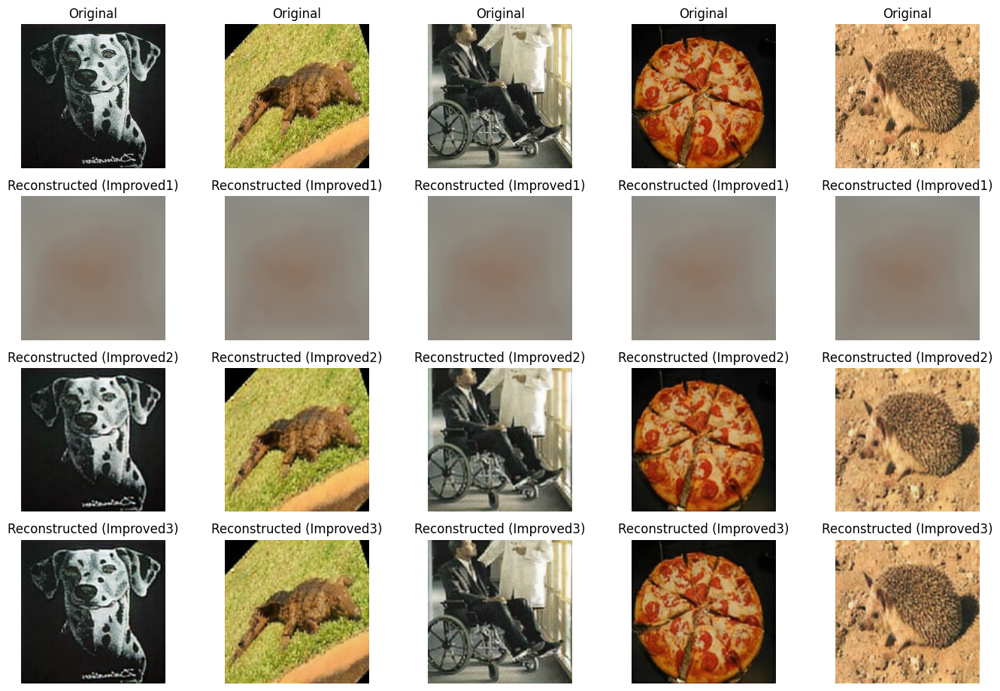

In [ ]:
def visualize_comparisons(original_images, reconstructed_images_list, model_names, n=5):
  
    plt.figure(figsize=(14, 3.1 * len(reconstructed_images_list)))
    
    for i in range(n):
        # Original image
        ax = plt.subplot(len(reconstructed_images_list) + 1, n, i + 1)
        plt.imshow(original_images[i])
        plt.title("Original")
        plt.axis("off")

        # Reconstructed images from each model
        for j, (reconstructed_images, model_name) in enumerate(zip(reconstructed_images_list, model_names)):
            ax = plt.subplot(len(reconstructed_images_list) + 1, n, (j + 1) * n + i + 1)
            plt.imshow(reconstructed_images[i])
            plt.title(f"Reconstructed ({model_name})")
            plt.axis("off")
    
    plt.tight_layout()
    plt.show()

    # Store results
model_names = ["Improved1", "Improved2", "Improved3"]
errors = []
reconstructed_images_list = []

# Evaluate each model
for model, name in zip(models, model_names):
    print(f"Evaluating {name}...")
    error, reconstructed = calculate_reconstruction_error(model, test_images)
    errors.append(error)
    reconstructed_images_list.append(reconstructed)

# Print reconstruction errors
for name, error in zip(model_names, errors):
    print(f"Model {name}: Mean Reconstruction Error = {error:.4f}")

# Visualize comparisons
visualize_comparisons(test_images, reconstructed_images_list, model_names, n=5)

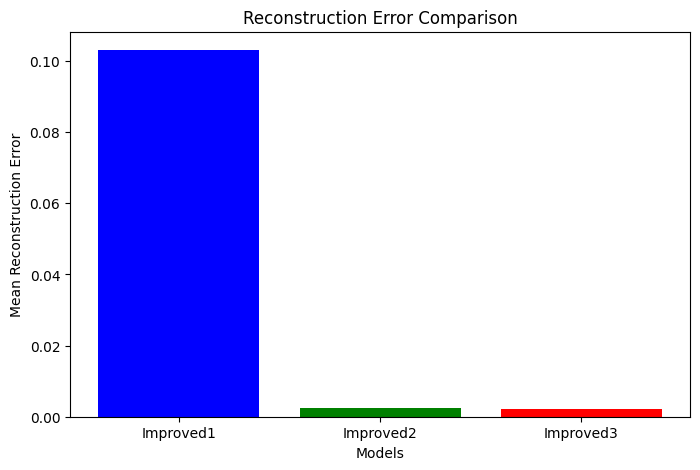

In [ ]:
def plot_reconstruction_errors(model_names, errors):
  
    plt.figure(figsize=(8, 5))
    plt.bar(model_names, errors, color=['blue', 'green', 'red'])
    plt.xlabel("Models")
    plt.ylabel("Mean Reconstruction Error")
    plt.title("Reconstruction Error Comparison")
    plt.show()

# Plot errors
plot_reconstruction_errors(model_names, errors)

Calculating accuracy for Improved1...
15/15 ━━━━━━━━━━━━━━━━━━━━ 11s 734ms/step
Model Improved1: Accuracy = 0.0632
Calculating accuracy for Improved2...
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 328ms/step
Model Improved2: Accuracy = 0.9847
Calculating accuracy for Improved3...
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 333ms/step
Model Improved3: Accuracy = 0.9869


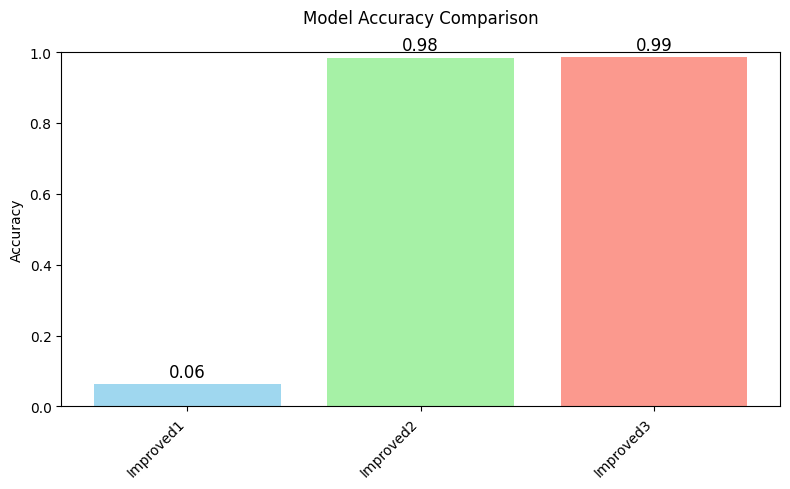

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

def calculate_accuracy(model, images, threshold=0.01):

    reconstructed = model.predict(images)
    errors = np.mean(np.square(images - reconstructed), axis=(1, 2, 3))  # Per-image MSE
    accuracy = np.mean(errors < threshold)  # Fraction of images with error below the threshold
    return accuracy

def plot_accuracy_bar_chart(model_names, accuracies):

    plt.figure(figsize=(8, 5))
    bar_positions = np.arange(len(model_names))
    colors = ['skyblue', 'lightgreen', 'salmon']  # Colors for bars
    plt.bar(bar_positions, accuracies, color=colors, alpha=0.8)
    plt.xticks(bar_positions, model_names, rotation=45, ha="right")
    plt.ylabel("Accuracy")
    plt.ylim(0, 1.0)  # Accuracy is between 0 and 1
    plt.title("Model Accuracy Comparison\n")
    for i, acc in enumerate(accuracies):
        plt.text(bar_positions[i], acc + 0.02, f"{acc:.2f}", ha='center', fontsize=12)  # Annotate bars
    plt.tight_layout()
    plt.show()

# Calculate accuracy for each model
threshold = 0.01  # Adjust the threshold for your use case
accuracies = []

for model, name in zip(models, model_names):
    print(f"Calculating accuracy for {name}...")
    accuracy = calculate_accuracy(model, test_images, threshold=threshold)
    accuracies.append(accuracy)
    print(f"Model {name}: Accuracy = {accuracy:.4f}")

# Plot accuracy comparison
plot_accuracy_bar_chart(model_names, accuracies)
